# import

In [1]:
!pip install umap-learn
!pip install kneed
!pip install plotly
# !pip install conda-colab

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import curve_fit

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.manifold import MDS
from sklearn import metrics
from sklearn.cluster import AgglomerativeClustering

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import classification_report

import plotly.express as px
from umap import UMAP
from kneed import KneeLocator
# import cupy as cp
# from cuml.cluster import DBSCAN as cuDBSCAN
# import modin.pandas as mpd
# import cudf
# from cuml.manifold import UMAP as cuUMAP
# from sklearn.metrics import silhouette_score
# from cuml.metrics.cluster.silhouette_score import cython_silhouette_score
# from cuml.neighbors import NearestNeighbors as cuNearestNeighbors


In [3]:
file1 = open("sample_data/fashion-mnist_test.csv", "r")
test1 = pd.read_csv(file1)

file2 = open("sample_data/fashion-mnist_train.csv", "r")
train1 = pd.read_csv(file2)

In [4]:
id_test = np.array(test1["label"])
test = test1.drop(columns=["label"])


id_train = np.array(train1["label"])
train = train1.drop(columns=["label"])
train1

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,6,0,0,0,0,0,0,0,5,0,...,0,0,0,30,43,0,0,0,0,0
3,0,0,0,0,1,2,0,0,0,0,...,3,0,0,0,0,1,0,0,0,0
4,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59996,1,0,0,0,0,0,0,0,0,0,...,73,0,0,0,0,0,0,0,0,0
59997,8,0,0,0,0,0,0,0,0,0,...,160,162,163,135,94,0,0,0,0,0
59998,8,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [5]:
del test1
del train1
names = ["T-shirt/top", "Trouser", "Pullover", "Dress", "Coat", "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"]
labels = { 0: 'T-shirt/top', 1: 'Trouser', 2: 'Pullover', 3: 'Dress', 4: 'Coat',
          5: 'Sandal', 6: 'Shirt', 7: 'Sneaker', 8 : 'Bag', 9 : 'Ankle boot'}

# TEST

In [ ]:
# for testing
X = test
id = id_test
size = id.size
X2 = X/256
X.shape

(10000, 784)

# TRAIN

In [ ]:
# for training
X = train
id = id_train
size = id.size
X2 = X/256
X.shape

(60000, 784)

# all

In [6]:
# concatenate
X = df_combined = pd.concat([train, test], ignore_index=True)
id = np.concatenate((id_train, id_test))
size = id.size
X2 = X/255
X.shape

X_bin = (X2 - X2.min()) / (X2.max() - X2.min())

print("\nDane po normalizacji:")
X_bin


Dane po normalizacji:


,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0
1,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0
2,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.019608,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.117647,0.168627,0.000000,0.000000,0.0,0.000000,0.0
3,0.0,0.000000,0.000000,0.005405,0.008811,0.0,0.0,0.000000,0.000000,0.000000,...,0.011765,0.000000,0.000000,0.000000,0.000000,0.003922,0.000000,0.0,0.000000,0.0
4,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.145098,...,0.125490,0.090196,0.054902,0.078431,0.000000,0.000000,0.003922,0.0,0.000000,0.0
69996,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.007843,0.203922,0.090196,0.109804,0.0,0.000000,0.0
69997,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.686275,0.674510,0.674510,0.713725,0.780392,0.870588,0.164706,0.0,0.003922,0.0
69998,0.0,0.022222,0.013274,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.003922,0.000000,0.0,0.000000,0.0


# DATA

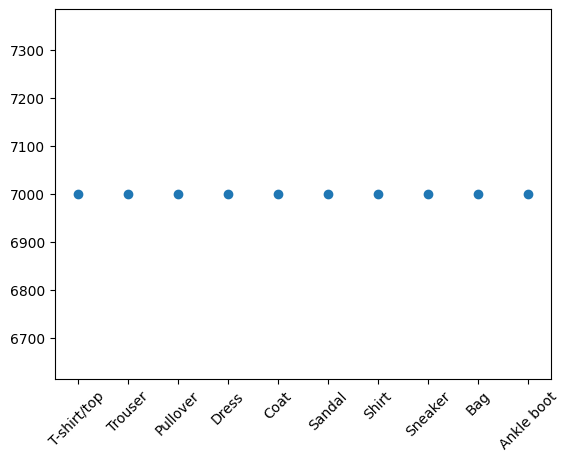

tyle samo kazdego


In [ ]:
y = np.arange(0,10)
count = np.zeros((10))
for i in range(size) :
    count[id[i]]+=1

plt.plot(y,count,'o')
plt.xticks(y, names, rotation=45)
plt.show()
print('tyle samo kazdego')

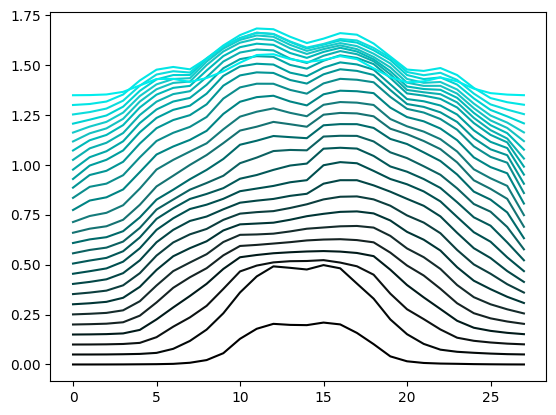

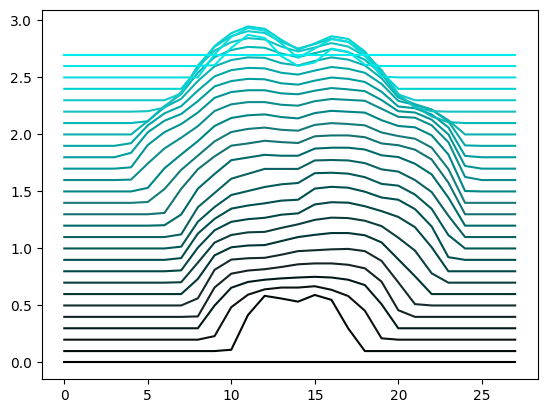

In [ ]:
y = np.arange(784)
y2 = np.arange(28)
pixel_mean = X2.mean()
for i in range(28) :
    p = pixel_mean[28*i:28*(1+i)]
    p = p +i*0.05
    plt.plot(y2, p, color=(0+i/3*i%3/(28+1),0+i/(28+1),0+i/(28+1)))
plt.show()

pixel_median = X2.median()
for i in range(28) :
    p = pixel_median[28*i:28*(1+i)]
    p = p +i*0.1
    plt.plot(y2, p, color=(0+i/3*i%3/(28+1),0+i/(28+1),0+i/(28+1)))
plt.show()

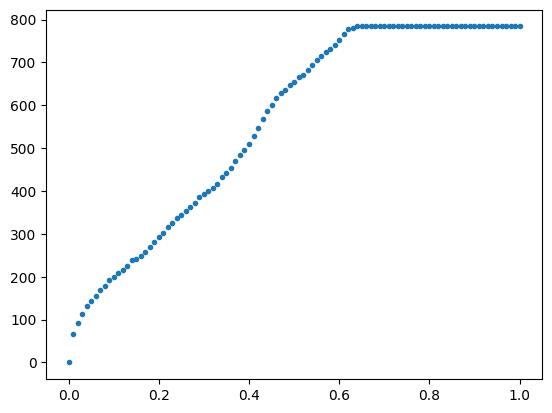

In [ ]:
less = np.zeros(101)
y = np.arange(0,101)

for i in range(0,101) :
    k = 0 + i/100
    less[i] = X2.mean()[X2.mean()<k].size
plt.plot(y/100,less,'.')

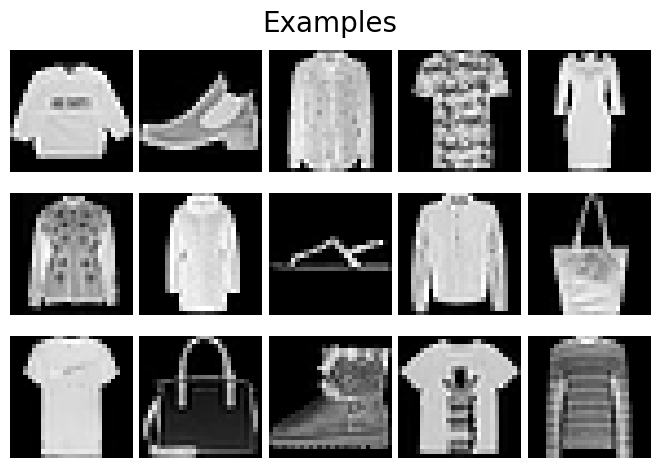

In [ ]:
fig,axe = plt.subplots(3,5)
axe = axe.flatten()
for i in range(15):
    axe[i].axis('off')
    abc = axe[i].imshow(X_bin.iloc[i,:].to_numpy().reshape(28,28), cmap='gray')
_= fig.suptitle('Examples',fontsize=20)
plt.tight_layout(pad= 0,h_pad= 0,w_pad= 0.5)

# Dim reduction

In [7]:
opt = 0
for i in range(15,30) :
  pca2 = PCA(n_components=i*10)
  pca2.fit(X_bin).transform(X_bin)
  print(i*10, pca2.explained_variance_ratio_.sum())
  if pca2.explained_variance_ratio_.sum()>0.95 :
    opt = i*10
    break
print("")
for i in range(10) :
  l = opt+i-9
  pca2 = PCA(n_components=l)
  pca2.fit(X_bin).transform(X_bin)
  print(l, pca2.explained_variance_ratio_.sum())
  if pca2.explained_variance_ratio_.sum()>0.95 :
    opt = l
    break
print(opt)

150 0.9374004276828563
160 0.9411498275952883
170 0.94461000945307
180 0.9478017808715792
190 0.9507839680392823

181 0.9481093588453753
182 0.9484133297306312
183 0.9487160831997762
184 0.9490182350373578
185 0.9493189488228935
186 0.949615510944531
187 0.949911276977316
188 0.9502053074144734
188


In [8]:
pca2 = PCA(n_components=opt)
Z = pca2.fit(X_bin).transform(X_bin)

In [9]:
Z.shape


(70000, 188)

# Visualization

In [10]:
Z_umap = UMAP(n_components=3, init='random', n_jobs=-1).fit_transform(Z)


In [13]:
umap_df = pd.DataFrame(Z_umap)
y = pd.DataFrame(id, columns=['class'])
y["class"].replace(labels, inplace=True)
new_df = pd.concat([umap_df,y["class"]],axis=1)
fig = px.scatter_3d(
    new_df, x=0, y=1, z=2,
    color='class', labels={'color': 'class'}
)
fig.update_traces(marker_size=1)
fig.show()

<ipython-input-13-cad943b6e0e7>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  y["class"].replace(labels, inplace=True)


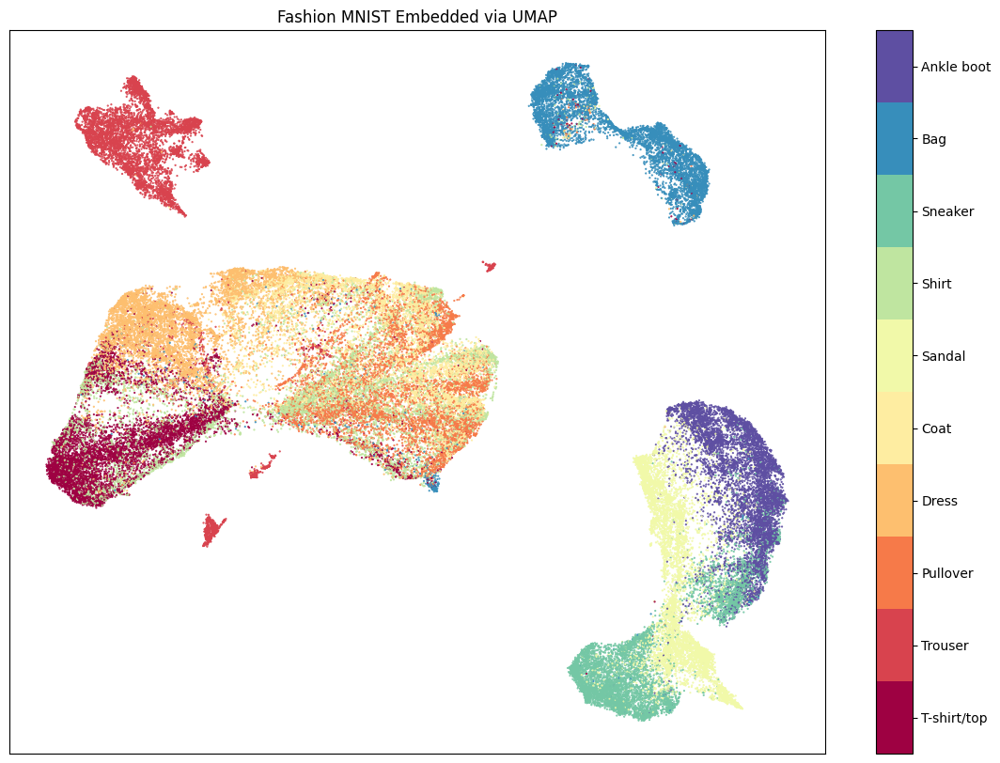

In [14]:
embedding = UMAP(n_components=2, init='random', n_jobs=-1).fit_transform(Z)

fig, ax = plt.subplots(1, figsize=(14, 10))
plt.scatter(*embedding.T, s=0.3, c=id, cmap='Spectral', alpha=1.0)
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(names)
plt.title('Fashion MNIST Embedded via UMAP');

In [15]:
# scaler = StandardScaler()
# Z_norm = scaler.fit_transform(Z)
Z_norm = Z/(Z.max()-Z.min())

In [16]:
Z_umap_norm = UMAP(n_components=3, init='random', n_jobs=-1).fit_transform(Z_norm)

In [17]:
umap_df = pd.DataFrame(Z_umap_norm)
y = pd.DataFrame(id, columns=['class'])
y["class"].replace(labels, inplace=True)
new_df = pd.concat([umap_df,y["class"]],axis=1)
fig = px.scatter_3d(
    new_df, x=0, y=1, z=2,
    color='class', labels={'color': 'class'}
)
fig.update_traces(marker_size=1)
fig.show()

<ipython-input-17-6cbb8a1c6aa4>:3: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





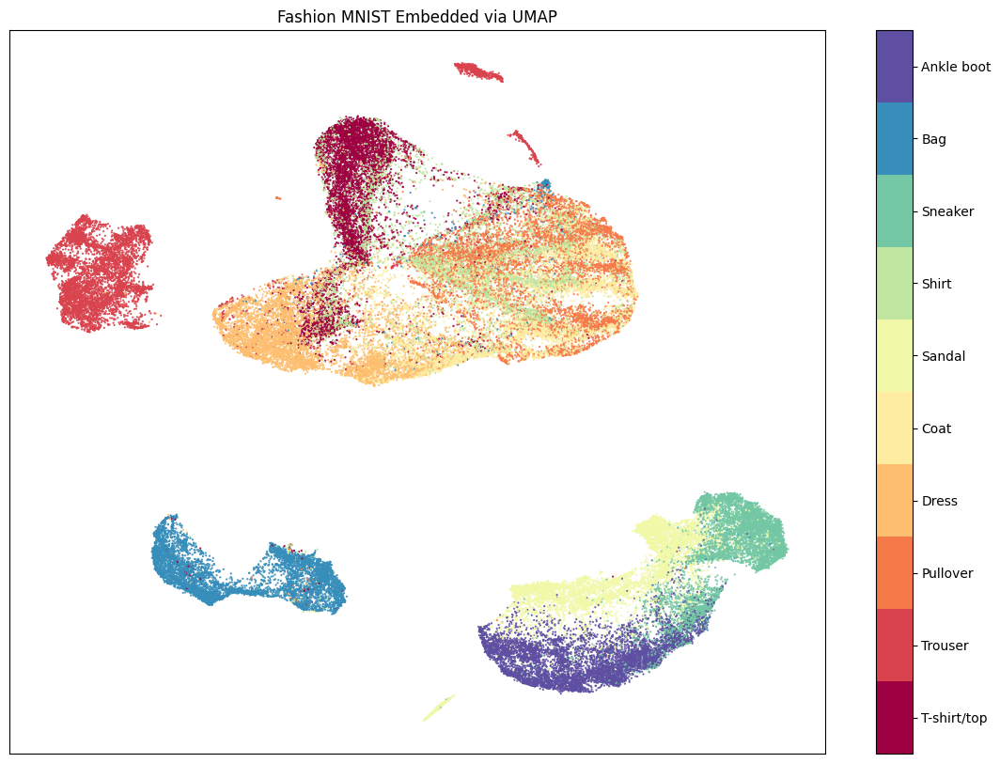

In [19]:
Z_norm2 = UMAP(n_components=2, init='random', n_jobs=-1).fit_transform(Z_norm)

fig, ax = plt.subplots(1, figsize=(14, 10))
plt.scatter(*Z_norm2.T, s=0.3, c=id, cmap='Spectral', alpha=1.0)
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(names)
plt.title('Fashion MNIST Embedded via UMAP');

## GPU:

In [ ]:
Z_umap = cuUMAP(n_components=3, init='random', random_state=0).fit_transform(Z)

In [ ]:
umap_df = pd.DataFrame(Z_umap)
y = pd.DataFrame(id, columns=['class'])
y["class"].replace(labels, inplace=True)
new_df = pd.concat([umap_df,y["class"]],axis=1)
fig = px.scatter_3d(
    new_df, x=0, y=1, z=2,
    color='class', labels={'color': 'class'}
)
fig.update_traces(marker_size=1)
fig.show()

The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.




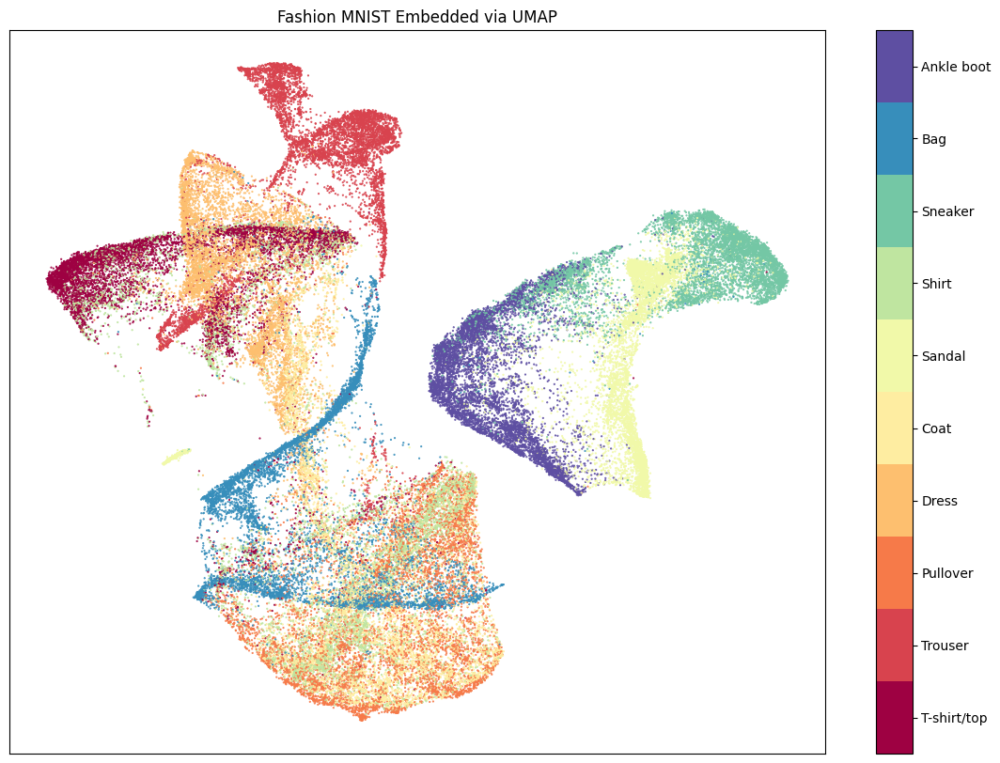

In [ ]:
embedding = cuUMAP(n_components=2, init='random', random_state=0).fit_transform(Z)

fig, ax = plt.subplots(1, figsize=(14, 10))
plt.scatter(*embedding.T, s=0.3, c=id, cmap='Spectral', alpha=1.0)
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(names)
plt.title('Fashion MNIST Embedded via UMAP');

# Clustering

## bez normalizacji

In [ ]:
Z_umap.shape

(70000, 3)

In [ ]:
kmeans = KMeans(n_clusters=30, random_state=0, n_init="auto").fit(Z_umap)
print(metrics.rand_score(id, kmeans.labels_))
kmeans = KMeans(n_clusters=30, random_state=0, n_init="auto").fit(Z_umap_norm)
print(metrics.rand_score(id, kmeans.labels_))

0.9125412791611309
0.9094461920884584


In [ ]:
n_neighbors = 6  # Przykładowa liczba sąsiadów

# Obliczanie odległości do najbliższych sąsiadów
distances, indices = NearestNeighbors(n_neighbors=n_neighbors).fit(Z_umap).kneighbors(Z_umap)

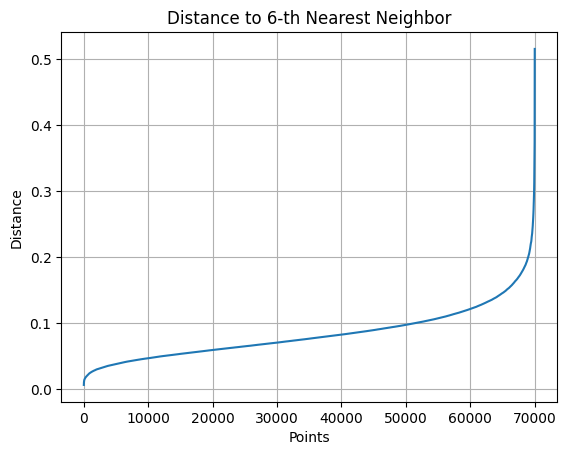

Punkt elbow: 69557 for distance=  0.23304210751188517
Odległość dla punktu elbow: 0.23304210751188517


In [ ]:
# Załóżmy, że 'distances' to już obliczone odległości do najbliższych sąsiadów
distances = np.sort(distances[:, -1], axis=0)  # Weź tylko odległości do ostatniego sąsiada

# Wizualizacja wykresu odległości
plt.plot(distances)
plt.title(f'Distance to {n_neighbors}-th Nearest Neighbor')
plt.xlabel('Points')
plt.ylabel('Distance')
plt.grid(True)
plt.show()

# Użycie KneeLocator do znalezienia punktu elbow
kneedle = KneeLocator(range(len(distances)), distances, curve='convex', direction='increasing')
elbow_point = kneedle.elbow

# Wyświetlenie punktu elbow
print(f'Punkt elbow: {elbow_point} for distance= ', distances[elbow_point])

# Zmienna 'lokiec' odpowiada wartości odległości dla punktu elbow
lokiec = distances[elbow_point]
print(f'Odległość dla punktu elbow: {lokiec}')


In [ ]:
dbscan = DBSCAN(eps=lokiec, min_samples=6,n_jobs=-1).fit(Z_umap)
score = metrics.rand_score(id, dbscan.labels_)
print(score)

0.7280014322653588


In [ ]:
silhouette_score(Z_umap, dbscan.labels_)

-0.03517557

In [ ]:
umap_df = pd.DataFrame(Z_umap)
y = pd.DataFrame(dbscan.labels_, columns=['class'])
y["class"].replace(labels, inplace=True)
new_df = pd.concat([umap_df,y["class"]],axis=1)
fig = px.scatter_3d(
    new_df, x=0, y=1, z=2,
    color='class', labels={'color': 'class'}
)
fig.update_traces(marker_size=1)
fig.show()

<ipython-input-24-24178c3cdf40>:3: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [ ]:
pred = dbscan.labels_
l_clust = pred.max()
# pred[pred==-1].size
res = []
for i in range(10) :
  pom = np.zeros(l_clust+2)
  for j in range(size) :
    if id[j]==i :
      pom[pred[j]+1]+=1
  res.append(pom)
res = np.array(res)
res.sum()
for i in range(l_clust+2) :
  print(i, res[:,i].sum())

In [ ]:
pred = dbscan.labels_
l_clust = pred.max()
# pred[pred==-1].size
res = []
for i in range(10) :
  pom = np.zeros(l_clust+2)
  for j in range(size) :
    if id[j]==i :
      pom[pred[j]+1]+=1
  res.append(pom)
res = np.array(res)
res.sum()
for i in range(l_clust+2) :
  print(i, res[:,i].sum())

res = np.array(res)
res.sum()
for i in range(l_clust+2) :
  print(i, res[:,i].sum())

for i in range(10):
  plt.figure(figsize=(50, 1))
  plt.subplot(2, 5, i+1)
  plt.plot(res[i,:],'.')
  plt.title(names[i])
plt.show()


0 133.0
1 6740.0
2 20999.0
3 35419.0
4 6638.0
5 7.0
6 14.0
7 15.0
8 13.0
9 6.0
10 12.0
11 4.0


### jakies dlasze analizy

In [ ]:
wierzchnie = Z_umap[pred==3-1]
id_wierzchnie = id[pred==3-1]

buty = Z_umap[pred==2-1]
id_buty = id[pred==2-1]

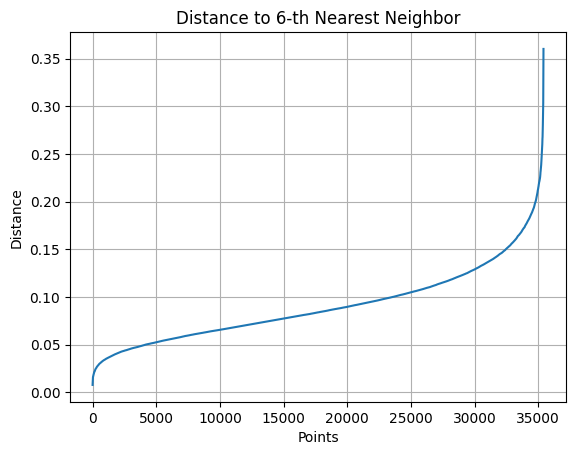

Punkt elbow: 35225 for distance=  0.23609956500218243
Odległość dla punktu elbow: 0.23609956500218243


In [ ]:
distances2, indices2 = NearestNeighbors(n_neighbors=n_neighbors).fit(wierzchnie).kneighbors(wierzchnie)
# Załóżmy, że 'distances' to już obliczone odległości do najbliższych sąsiadów
distances2 = np.sort(distances2[:, -1], axis=0)  # Weź tylko odległości do ostatniego sąsiada

# Wizualizacja wykresu odległości
plt.plot(distances2)
plt.title(f'Distance to {n_neighbors}-th Nearest Neighbor')
plt.xlabel('Points')
plt.ylabel('Distance')
plt.grid(True)
plt.show()

# Użycie KneeLocator do znalezienia punktu elbow
kneedle2 = KneeLocator(range(len(distances2)), distances2, curve='convex', direction='increasing')
elbow_point2 = kneedle2.elbow

# Wyświetlenie punktu elbow
print(f'Punkt elbow: {elbow_point2} for distance= ', distances2[elbow_point2])

# Zmienna 'lokiec' odpowiada wartości odległości dla punktu elbow
lokiec2 = distances2[elbow_point2]
print(f'Odległość dla punktu elbow: {lokiec2}')

In [ ]:
dbscan2 = DBSCAN(eps=0.10, min_samples=6,n_jobs=-1).fit(wierzchnie)
score2 = metrics.rand_score(id_wierzchnie, dbscan2.labels_)
print(score2)

0.7533252967610289


In [ ]:
umap_df = pd.DataFrame(wierzchnie)
y = pd.DataFrame(dbscan2.labels_, columns=['class'])
y["class"].replace(labels, inplace=True)
new_df = pd.concat([umap_df,y["class"]],axis=1)
fig = px.scatter_3d(
    new_df, x=0, y=1, z=2,
    color='class', labels={'color': 'class'}
)
fig.update_traces(marker_size=1)
fig.show()

<ipython-input-39-e94b88743cc9>:3: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





0 6745.0
1 2132.0
2 2876.0
3 2803.0
4 10699.0
5 6.0
6 571.0
7 4493.0
8 40.0
9 111.0
10 64.0
11 61.0
12 13.0
13 64.0
14 15.0
15 12.0
16 17.0
17 135.0
18 26.0
19 5.0
20 791.0
21 28.0
22 15.0
23 241.0
24 6.0
25 47.0
26 48.0
27 14.0
28 26.0
29 42.0
30 15.0
31 12.0
32 120.0
33 20.0
34 20.0
35 47.0
36 7.0
37 18.0
38 48.0
39 17.0
40 54.0
41 23.0
42 17.0
43 11.0
44 16.0
45 11.0
46 39.0
47 16.0
48 15.0
49 105.0
50 13.0
51 18.0
52 21.0
53 10.0
54 85.0
55 7.0
56 65.0
57 69.0
58 17.0
59 16.0
60 7.0
61 24.0
62 15.0
63 26.0
64 7.0
65 39.0
66 12.0
67 5.0
68 13.0
69 44.0
70 17.0
71 33.0
72 9.0
73 34.0
74 11.0
75 91.0
76 6.0
77 41.0
78 10.0
79 16.0
80 30.0
81 19.0
82 11.0
83 15.0
84 23.0
85 8.0
86 27.0
87 10.0
88 42.0
89 22.0
90 27.0
91 12.0
92 15.0
93 14.0
94 24.0
95 20.0
96 10.0
97 9.0
98 5.0
99 6.0
100 6.0
101 23.0
102 4.0
103 9.0
104 18.0
105 8.0
106 10.0
107 14.0
108 9.0
109 8.0
110 8.0
111 16.0
112 31.0
113 27.0
114 9.0
115 14.0
116 11.0
117 24.0
118 14.0
119 5.0
120 15.0
121 8.0
122 8.0
123 8.0


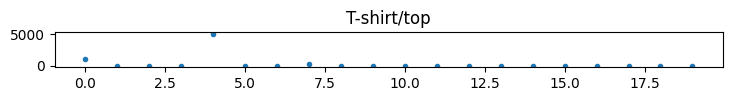

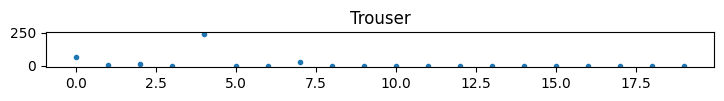

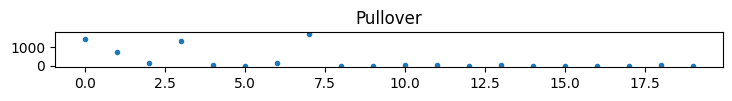

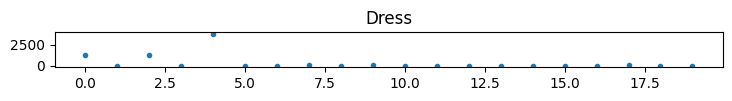

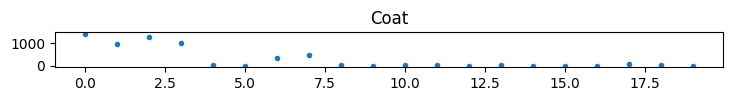

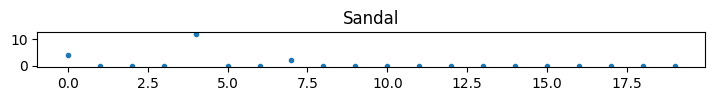

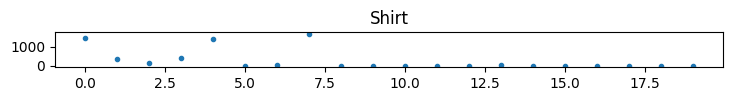

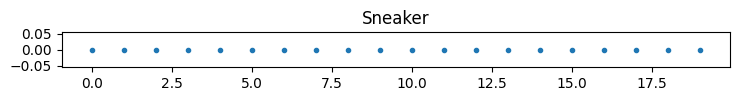

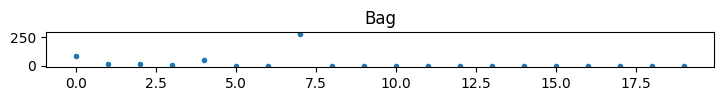

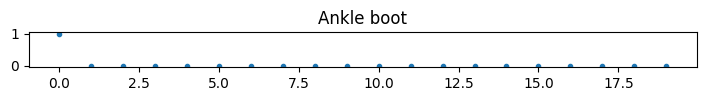

In [ ]:
pred2 = dbscan2.labels_
l_clust2 = pred2.max()
# pred[pred==-1].size
res2 = []
for i in range(10) :
  pom = np.zeros(l_clust2+2)
  for j in range(id_wierzchnie.size) :
    if id_wierzchnie[j]==i :
      pom[pred2[j]+1]+=1
  res2.append(pom)

res2 = np.array(res2)
res2.sum()
for i in range(l_clust2+2) :
  print(i, res2[:,i].sum())

for i in range(10):
  plt.figure(figsize=(50, 1))
  plt.subplot(2, 5, i+1)
  plt.plot(res2[i,:20],'.')
  plt.title(names[i])
plt.show()


## po normalizacji

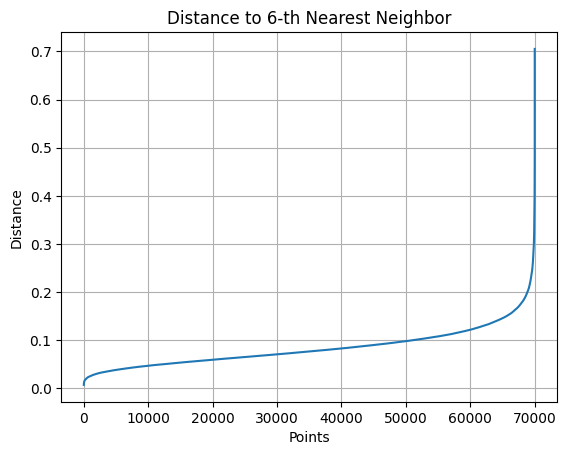

Punkt elbow: 69606 for distance=  0.24594359059513227
Odległość dla punktu elbow: 0.24594359059513227


In [20]:
n_neighbors = 6

distances, indices = NearestNeighbors(n_neighbors=n_neighbors).fit(Z_umap_norm).kneighbors(Z_umap_norm)
distances = np.sort(distances[:, -1], axis=0)

plt.plot(distances)
plt.title(f'Distance to {n_neighbors}-th Nearest Neighbor')
plt.xlabel('Points')
plt.ylabel('Distance')
plt.grid(True)
plt.show()

kneedle = KneeLocator(range(len(distances)), distances, curve='convex', direction='increasing')
elbow_point = kneedle.elbow

print(f'Punkt elbow: {elbow_point} for distance= ', distances[elbow_point])

lokiec = distances[elbow_point]
print(f'Odległość dla punktu elbow: {lokiec}')

In [37]:
dbscan3 = DBSCAN(eps=0.40  , min_samples=6,n_jobs=-1).fit(Z_umap_norm)
score = metrics.rand_score(id, dbscan3.labels_)
print(score)

0.724571210200962


In [38]:
silhouette_score(Z_umap_norm[60000:], dbscan3.labels_[60000:])

0.23854636

In [23]:
from joblib import Parallel, delayed
from sklearn.metrics import silhouette_samples

In [24]:
results = []
for l in range(5) :
  r_temp = np.zeros(13)
  print(l)
  for e in range(13) :
    r_temp[e] = silhouette_score(Z_umap_norm[60000:],DBSCAN(eps=lokiec+0.02*(e-6), min_samples=n_neighbors+(l-2),n_jobs=-1).fit(Z_umap_norm).labels_[60000:])
    print(lokiec+0.02*(e-6))
  results.append(r_temp)
  print('\n')

0
0.12594359059513227
0.14594359059513226
0.16594359059513225
0.18594359059513227
0.20594359059513226
0.22594359059513228
0.24594359059513227
0.2659435905951323
0.28594359059513225
0.30594359059513226
0.3259435905951323
0.34594359059513224
0.36594359059513226


1
0.12594359059513227
0.14594359059513226
0.16594359059513225
0.18594359059513227
0.20594359059513226
0.22594359059513228
0.24594359059513227
0.2659435905951323
0.28594359059513225
0.30594359059513226
0.3259435905951323
0.34594359059513224
0.36594359059513226


2
0.12594359059513227
0.14594359059513226
0.16594359059513225
0.18594359059513227
0.20594359059513226
0.22594359059513228
0.24594359059513227
0.2659435905951323
0.28594359059513225
0.30594359059513226
0.3259435905951323
0.34594359059513224
0.36594359059513226


3
0.12594359059513227
0.14594359059513226
0.16594359059513225
0.18594359059513227
0.20594359059513226
0.22594359059513228
0.24594359059513227
0.2659435905951323
0.28594359059513225
0.30594359059513226
0.32594359059

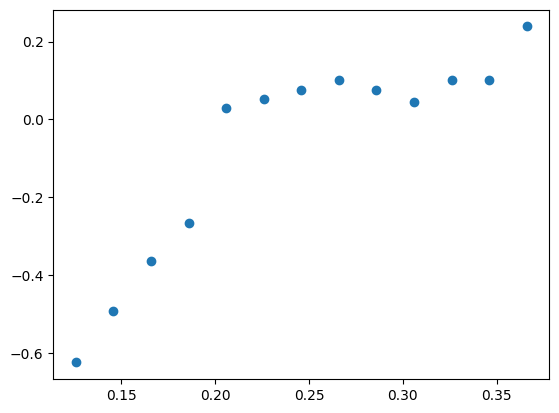

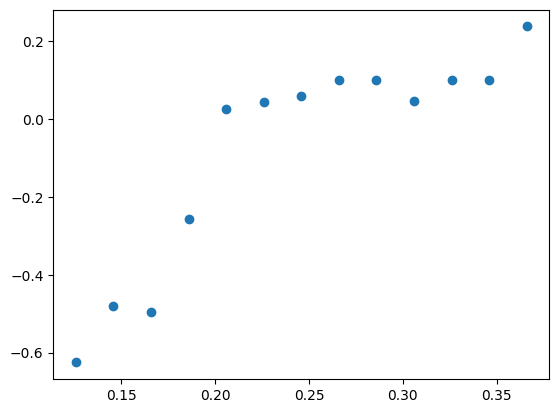

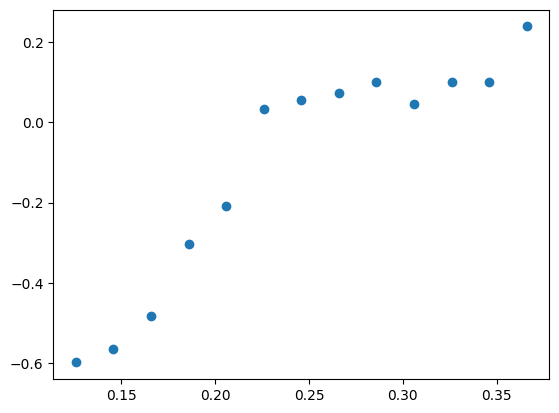

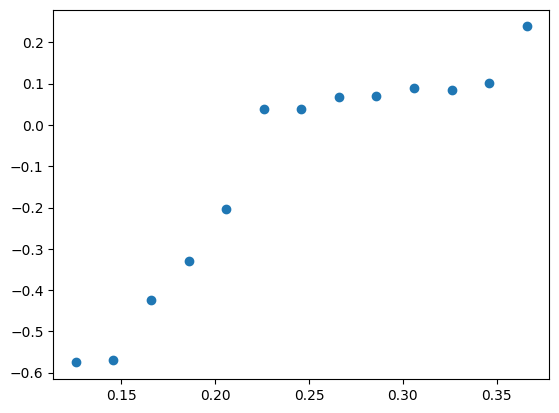

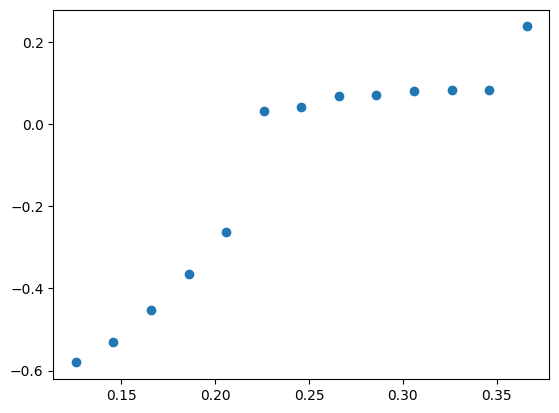

[array([-0.62331462, -0.49107355, -0.36396658, -0.26603776,  0.02873185,
        0.05217823,  0.07617971,  0.10086966,  0.07483233,  0.04603028,
        0.10114074,  0.10114074,  0.23854636]), array([-0.62523001, -0.47940367, -0.49473256, -0.25765488,  0.02692662,
        0.04475537,  0.06074268,  0.10088122,  0.10043918,  0.04603028,
        0.10114074,  0.10114074,  0.23854636]), array([-0.59829795, -0.56425256, -0.48359179, -0.30263144, -0.20923199,
        0.0331553 ,  0.05616451,  0.0717323 ,  0.1008756 ,  0.04603028,
        0.10114074,  0.10114074,  0.23854636]), array([-0.57542229, -0.56901288, -0.42325607, -0.33014879, -0.2038575 ,
        0.03905513,  0.03762005,  0.06796378,  0.06956818,  0.08976737,
        0.08366034,  0.10114074,  0.23854636]), array([-0.58037233, -0.53086162, -0.45132142, -0.36528316, -0.26329964,
        0.03299735,  0.04231923,  0.06797118,  0.07175704,  0.08153916,
        0.08460547,  0.08383213,  0.23854636])] [0.12594359 0.14594359 0.16594359 0.185

In [25]:
e = np.arange(0,13)
plt.plot(lokiec+0.02*(e-6),results[0],'o')
plt.show()
plt.plot(lokiec+0.02*(e-6),results[1],'o')
plt.show()
plt.plot(lokiec+0.02*(e-6),results[2],'o')
plt.show()
plt.plot(lokiec+0.02*(e-6),results[3],'o')
plt.show()
plt.plot(lokiec+0.02*(e-6),results[4],'o')
plt.show()
print(results, lokiec+0.02*(e-6))
print(np.argmax(results), np.max(results))

In [26]:
dbscan = DBSCAN(eps=lokiec+0.01*(np.argmax(results[0])-6), min_samples=n_neighbors+(0-2),n_jobs=-1).fit(Z_umap_norm)

In [47]:
dbscan.labels_[dbscan.labels_==5].size

14

In [27]:
labels2 = {-1: '-1', 0: '0', 1: '1', 2: '2', 3: '3', 4: '4'}

umap_df = pd.DataFrame(Z_umap_norm)
y = pd.DataFrame(dbscan.labels_, columns=['class'])
y["class"].replace(labels2 , inplace=True)
new_df = pd.concat([umap_df,y["class"]],axis=1)
fig = px.scatter_3d(
    new_df, x=0, y=1, z=2,
    color='class', labels={'color': 'class'}
)
fig.update_traces(marker_size=1)
fig.show()

<ipython-input-27-13a17f8c15d5>:5: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





0 16.0
1 35737.0
2 21016.0
3 6553.0
4 6586.0
5 78.0
6 14.0
0 16.0
1 35737.0
2 21016.0
3 6553.0
4 6586.0
5 78.0
6 14.0


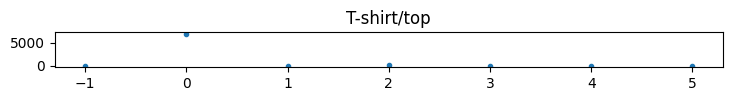

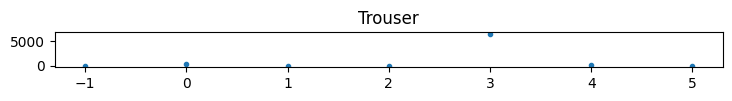

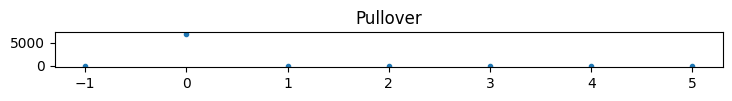

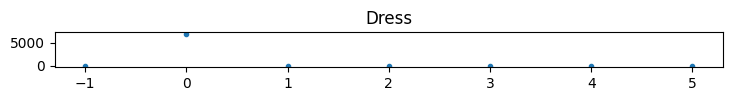

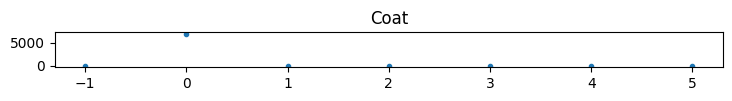

...

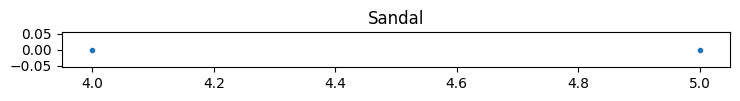

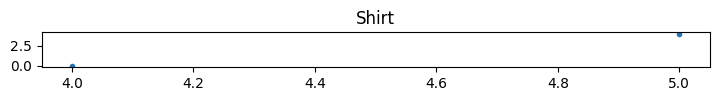

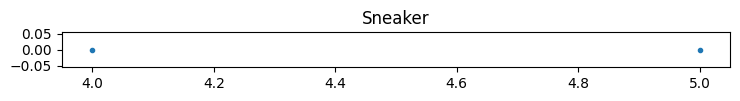

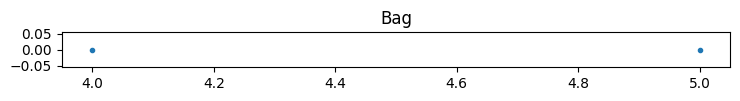

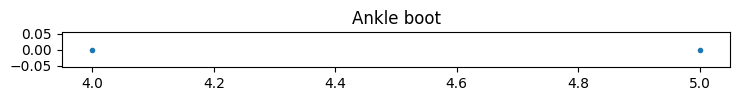

In [35]:
pred = dbscan.labels_
l_clust = pred.max()
# pred[pred==-1].size
res = []
for i in range(10) :
  pom = np.zeros(l_clust+2)
  for j in range(size) :
    if id[j]==i :
      pom[pred[j]+1]+=1
  res.append(pom)
res = np.array(res)
res.sum()
for i in range(l_clust+2) :
  print(i, res[:,i].sum())

res = np.array(res)
res.sum()
for i in range(l_clust+2) :
  print(i, res[:,i].sum())

for i in range(10):
  plt.figure(figsize=(50, 1))
  plt.subplot(2, 5, i+1)
  plt.plot(np.arange(res[i,:].size)-1, res[i,:],'.')
  plt.title(names[i])
plt.show()
print('\n\n\n\n\n')
for i in range(10):
  plt.figure(figsize=(50, 1))
  plt.subplot(2, 5, i+1)
  plt.plot(np.arange(res[i,5:].size)+4, res[i,5:],'.')
  plt.title(names[i])
plt.show()

In [39]:
score = metrics.rand_score(id, dbscan.labels_)
print(score)

0.724571210200962


## GPU

In [ ]:
scaler = StandardScaler()
Z_norm = scaler.fit_transform(Z)
Z_cudf = cudf.DataFrame.from_records(Z)
Z_norm_cu = cudf.DataFrame.from_records(Z_norm)

In [ ]:
kmeans = KMeans(n_clusters=10, random_state=0, n_init="auto").fit(Z_norm)
kmeans.labels_
# kmeans.cluster_centers_
metrics.rand_score(id, kmeans.labels_)
# cython_silhouette_score(Z_norm, kmeans.labels_)

In [ ]:
n_neighbors = 10  # Przykładowa liczba sąsiadów

# Obliczanie odległości do najbliższych sąsiadów
distances, indices = cuNearestNeighbors(n_neighbors=n_neighbors).fit(Z_cudf).kneighbors(Z_cudf)

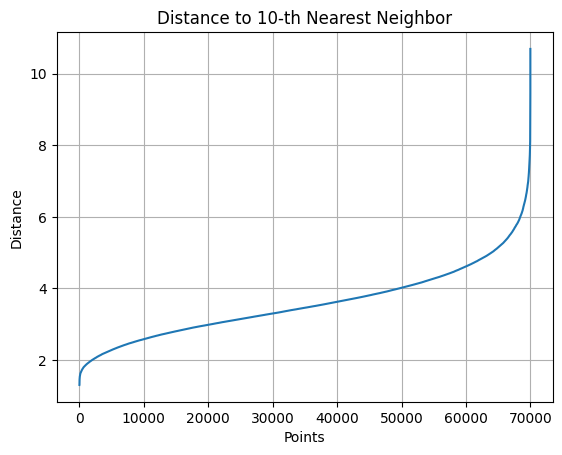

Punkt elbow: 69902 for distance=  7.6759205


In [ ]:
# Posortowanie odległości (odległość do najbliższego sąsiada)
distances_np = distances.iloc[:, -1].to_numpy()
distances = cp.sort(distances_np, axis=0)  # Weź tylko odległości do ostatniego sąsiada

# Wizualizacja wykresu odległości
plt.plot(distances)
plt.title(f'Distance to {n_neighbors}-th Nearest Neighbor')
plt.xlabel('Points')
plt.ylabel('Distance')
plt.grid(True)
plt.show()

kneedle = KneeLocator(range(len(distances)), distances, curve='convex', direction='increasing')
elbow_point = kneedle.elbow

print(f'Punkt elbow: {elbow_point} for distance= ', distances[elbow_point])

In [ ]:
dbscan = cuDBSCAN(eps=distances[elbow_point], min_samples=2*opt).fit(Z_cudf)
# score = metrics.rand_score(id, dbscan.labels_)
print(score)

[W] [10:17:29.214186] Batch size limited by the chosen integer type (4 bytes). 35892 -> 30678. Using the larger integer type might result in better performance
0.10080973075125563


In [ ]:
silhouette_avg = cython_silhouette_score(Z_cudf, dbscan.labels_)

In [ ]:
lokiec = distances[elbow_point]

In [ ]:
results = []
for l in range(2) :
  r_temp = np.zeros(14)
  print(l)
  for e in range(14) :
    r_temp[e] = cython_silhouette_score(Z_cudf,cuDBSCAN(eps=lokiec+0.2*(e-7), min_samples=(l+1)*opt).fit(Z_cudf).labels_)
    print(lokiec+0.2*(e-7))
  results.append(r_temp)
  print('\n')

0
[W] [10:23:51.768491] Batch size limited by the chosen integer type (4 bytes). 35892 -> 30678. Using the larger integer type might result in better performance
6.275921078365482
[W] [10:24:36.518786] Batch size limited by the chosen integer type (4 bytes). 35892 -> 30678. Using the larger integer type might result in better performance
6.475921078365483
[W] [10:25:20.903810] Batch size limited by the chosen integer type (4 bytes). 35892 -> 30678. Using the larger integer type might result in better performance
6.675921078365483
[W] [10:26:05.291591] Batch size limited by the chosen integer type (4 bytes). 35892 -> 30678. Using the larger integer type might result in better performance
6.875921078365483
[W] [10:26:49.662250] Batch size limited by the chosen integer type (4 bytes). 35892 -> 30678. Using the larger integer type might result in better performance
7.075921078365482
[W] [10:27:34.058666] Batch size limited by the chosen integer type (4 bytes). 35892 -> 30678. Using the lar

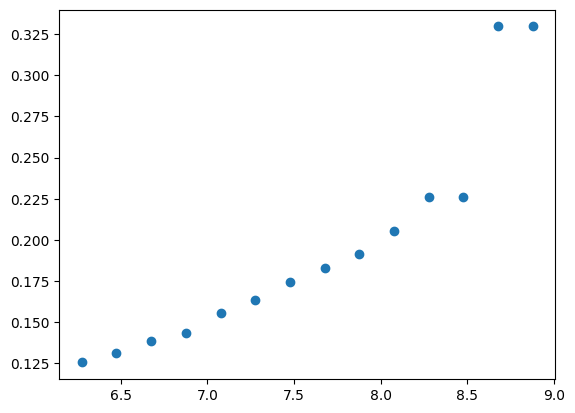

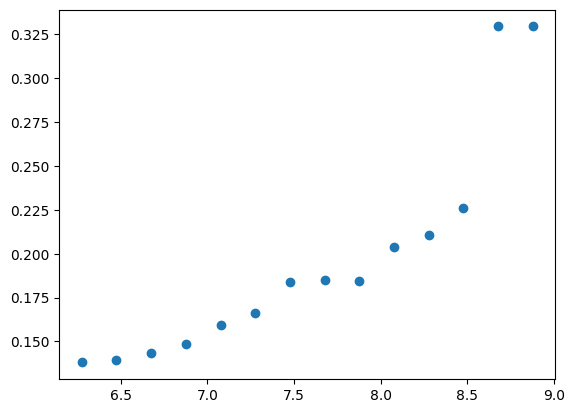

[array([0.12560196, 0.13130445, 0.13885021, 0.14361354, 0.1558755 ,
       0.16339884, 0.17449825, 0.18286697, 0.19152275, 0.2051492 ,
       0.22598685, 0.22598685, 0.32953606, 0.32953606]), array([0.13804075, 0.13918245, 0.14352515, 0.14844857, 0.15919059,
       0.16650661, 0.18366237, 0.18488827, 0.18437132, 0.20358077,
       0.21072197, 0.22598685, 0.32953606, 0.32953606])] [6.27592108 6.47592108 6.67592108 6.87592108 7.07592108 7.27592108
 7.47592108 7.67592108 7.87592108 8.07592108 8.27592108 8.47592108
 8.67592108 8.87592108]


In [ ]:
e = np.arange(0,14)
plt.plot(lokiec+0.2*(e-7),results[0],'o')
plt.show()
plt.plot(lokiec+0.2*(e-7),results[1],'o')
plt.show()
print(results, lokiec+0.2*(e-7))

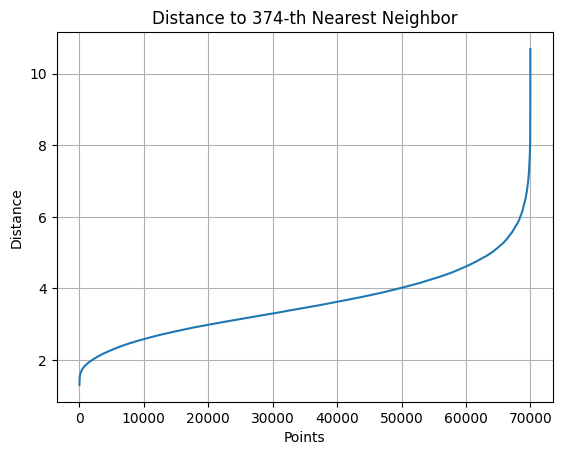

Punkt elbow: 69902 for distance=  7.6759205


In [ ]:
n_neighbors2 = 2*opt  # Przykładowa liczba sąsiadów

# Obliczanie odległości do najbliższych sąsiadów
distances2, indices2 = cuNearestNeighbors(n_neighbors=n_neighbors).fit(Z_cudf).kneighbors(Z_cudf)

# Posortowanie odległości (odległość do najbliższego sąsiada)
distances_np2 = distances2.iloc[:, -1].to_numpy()
distances2 = cp.sort(distances_np2, axis=0)  # Weź tylko odległości do ostatniego sąsiada

# Wizualizacja wykresu odległości
plt.plot(distances2)
plt.title(f'Distance to {n_neighbors2}-th Nearest Neighbor')
plt.xlabel('Points')
plt.ylabel('Distance')
plt.grid(True)
plt.show()

kneedle = KneeLocator(range(len(distances2)), distances2, curve='convex', direction='increasing')
elbow_point2 = kneedle.elbow

print(f'Punkt elbow: {elbow_point2} for distance= ', distances2[elbow_point2])
lokiec2 = distances2[elbow_point2]

In [ ]:
eps1= 8.3+np.arange(0,41)/100
results2=np.zeros(eps1.size)
print(results2.size)
for i in range(eps1.size) :
  results2[i] = cython_silhouette_score(Z_cudf,cuDBSCAN(eps=eps1[i], min_samples=opt).fit(Z_cudf).labels_)
  print(eps1[i])

41
[W] [11:48:55.364784] Batch size limited by the chosen integer type (4 bytes). 35892 -> 30678. Using the larger integer type might result in better performance
8.3
[W] [11:49:40.054254] Batch size limited by the chosen integer type (4 bytes). 35892 -> 30678. Using the larger integer type might result in better performance
8.31
[W] [11:50:24.390062] Batch size limited by the chosen integer type (4 bytes). 35892 -> 30678. Using the larger integer type might result in better performance
8.32
[W] [11:51:08.846495] Batch size limited by the chosen integer type (4 bytes). 35892 -> 30678. Using the larger integer type might result in better performance
8.33
[W] [11:51:53.300292] Batch size limited by the chosen integer type (4 bytes). 35892 -> 30678. Using the larger integer type might result in better performance
8.34
[W] [11:52:37.780583] Batch size limited by the chosen integer type (4 bytes). 35892 -> 30678. Using the larger integer type might result in better performance
8.35000000000

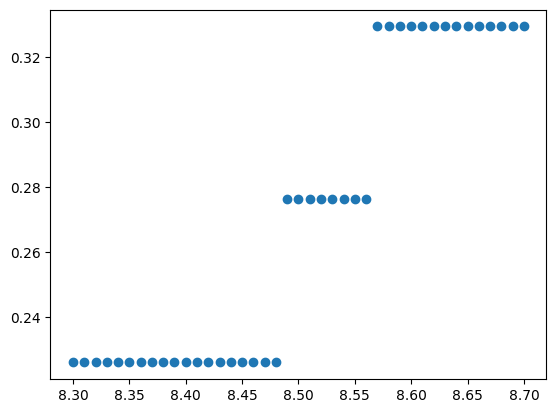

array([0.22598685, 0.22598685, 0.22598685, 0.22598685, 0.22598685,
       0.22598685, 0.22598685, 0.22598685, 0.22598685, 0.22598685,
       0.22598685, 0.22598685, 0.22598685, 0.22598685, 0.22598685,
       0.22598685, 0.22598685, 0.22598685, 0.22598685, 0.27648831,
       0.27648831, 0.27648831, 0.27648831, 0.27648831, 0.27648831,
       0.27648831, 0.27648831, 0.32953606, 0.32953606, 0.32953606,
       0.32953606, 0.32953606, 0.32953606, 0.32953606, 0.32953606,
       0.32953606, 0.32953606, 0.32953606, 0.32953606, 0.32953606,
       0.32953606])

In [ ]:
plt.plot(eps1,results2,'o')
plt.show()
results2

In [ ]:
dbscan = cuDBSCAN(eps=8.5, min_samples=2*opt).fit(Z_cudf)

[W] [12:29:27.133038] Batch size limited by the chosen integer type (4 bytes). 35892 -> 30678. Using the larger integer type might result in better performance


In [ ]:
dbscan.labels_[dbscan.labels_==0].size

69998

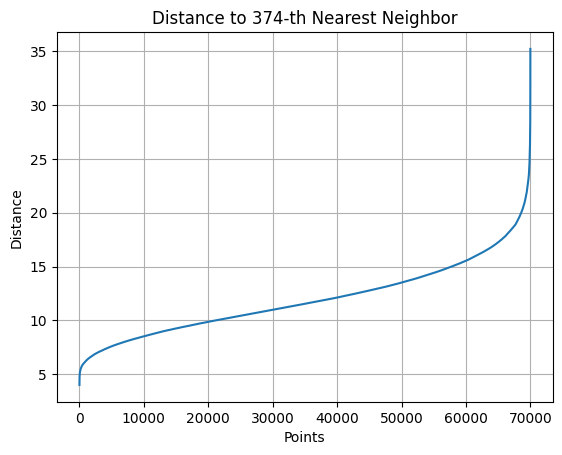

Punkt elbow: 69718 for distance=  23.235975


In [ ]:
n_neighbors2 = 2*opt  # Przykładowa liczba sąsiadów

# Obliczanie odległości do najbliższych sąsiadów
distances2, indices2 = cuNearestNeighbors(n_neighbors=n_neighbors).fit(Z_norm_cu).kneighbors(Z_norm_cu)

# Posortowanie odległości (odległość do najbliższego sąsiada)
distances_np2 = distances2.iloc[:, -1].to_numpy()
distances2 = cp.sort(distances_np2, axis=0)  # Weź tylko odległości do ostatniego sąsiada

# Wizualizacja wykresu odległości
plt.plot(distances2)
plt.title(f'Distance to {n_neighbors2}-th Nearest Neighbor')
plt.xlabel('Points')
plt.ylabel('Distance')
plt.grid(True)
plt.show()

kneedle = KneeLocator(range(len(distances2)), distances2, curve='convex', direction='increasing')
elbow_point2 = kneedle.elbow

print(f'Punkt elbow: {elbow_point2} for distance= ', distances2[elbow_point2])
lokiec2 = distances2[elbow_point2]

In [ ]:
Z_umap.shape

(70000, 3)

In [ ]:
Z_umap_cu = cudf.DataFrame.from_records(Z_umap)

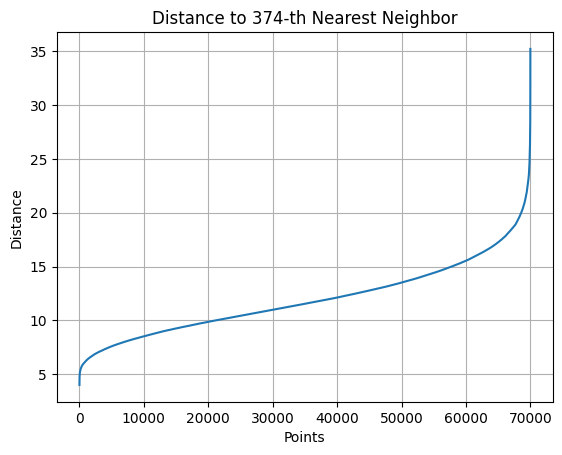

Punkt elbow: 69564 for distance=  0.38560772


In [ ]:
n_neighbors3 = 6  # Przykładowa liczba sąsiadów

# Obliczanie odległości do najbliższych sąsiadów
distances3, indices3 = cuNearestNeighbors(n_neighbors=n_neighbors).fit(Z_umap_cu).kneighbors(Z_umap_cu)

# Posortowanie odległości (odległość do najbliższego sąsiada)
distances_np3 = distances3.iloc[:, -1].to_numpy()
distances3 = cp.sort(distances_np3, axis=0)  # Weź tylko odległości do ostatniego sąsiada

# Wizualizacja wykresu odległości
plt.plot(distances3)
plt.title(f'Distance to {n_neighbors3}-th Nearest Neighbor')
plt.xlabel('Points')
plt.ylabel('Distance')
plt.grid(True)
plt.show()

kneedle = KneeLocator(range(len(distances3)), distances3, curve='convex', direction='increasing')
elbow_point3 = kneedle.elbow

print(f'Punkt elbow: {elbow_point3} for distance= ', distances3[elbow_point3])
lokiec3 = distances2[elbow_point3]

In [ ]:
dbscan = cuDBSCAN(eps=8.5, min_samples=6).fit(Z_umap_cu)

In [ ]:
dbscan.labels_[dbscan.labels_==0].size

70000

# Classification

In [36]:
k_values = range(2, 10)
cm_t = []
cm_t_norm = []
acc_t = []
pred_t = []
for k in k_values:
    pred = cross_val_predict(KNeighborsClassifier(n_neighbors=k), Z_norm, id, cv=5)
    print('k=',k)
    # print(cm)
    cm_t.append(confusion_matrix(id, pred))
    cm_t_norm.append(confusion_matrix(id, pred, normalize='true'))
    # print("\n")
    acc_t.append(np.mean(pred == id))
    pred_t.append(pred)


k= 2
k= 3
k= 4
k= 5
k= 6
k= 7
k= 8
k= 9


In [40]:
report = classification_report(id, pred_t[np.argmax(acc_t)], output_dict=True)

# Konwertowanie raportu na DataFrame dla łatwiejszej wizualizacji
report_df = pd.DataFrame(report).transpose()

# Wyświetlenie raportu
report_df

,precision,recall,f1-score,support
0,0.765584,0.886000,0.821403,7000.000000
1,0.990653,0.969000,0.979707,7000.000000
2,0.746583,0.811429,0.777656,7000.000000
3,0.898293,0.879429,0.888761,7000.000000
4,0.776943,0.768286,0.772590,7000.000000
5,0.987682,0.893429,0.938194,7000.000000
6,0.695350,0.572571,0.628016,7000.000000
7,0.904384,0.960714,0.931699,7000.000000
8,0.974344,0.960286,0.967264,7000.000000
9,0.922769,0.954143,0.938194,7000.000000


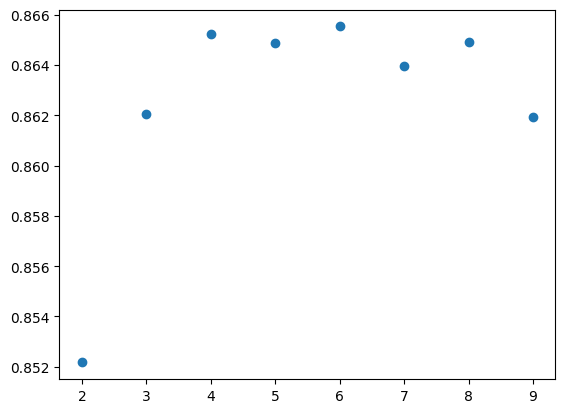

highest acc= 0.8655285714285714  for k= 6


<Figure size 5000x1000 with 0 Axes>

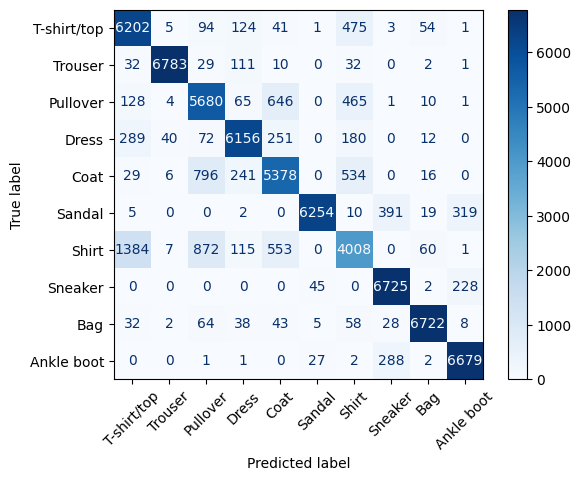

<Figure size 5000x1000 with 0 Axes>

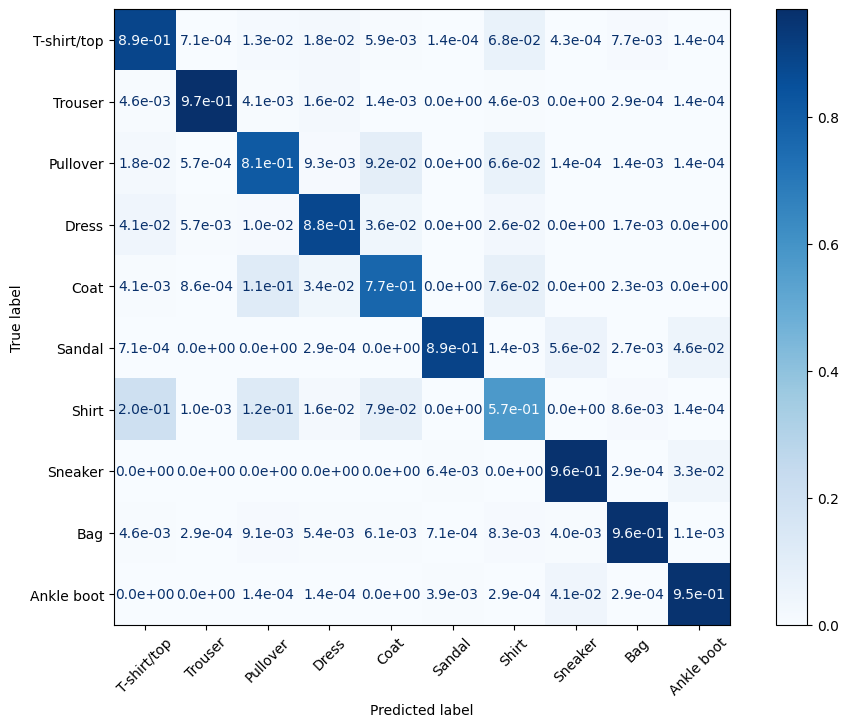

In [41]:
plt.plot(k_values, acc_t, 'o')
plt.show()
acc_t = np.array(acc_t)
print('highest acc=', np.max(acc_t),' for k=', k_values[np.argmax(acc_t)])


plt.figure(figsize=(50, 10))
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm_t[np.argmax(acc_t)],
                                    display_labels = names)
cm_display.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.show()


plt.figure(figsize=(50, 10))
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm_t_norm[np.argmax(acc_t)],
                                    display_labels = names)
# cm_display.plot(cmap=plt.cm.Blues, xticks_rotation=45)

fig, ax = plt.subplots(figsize=(12, 8))  # Tworzymy figure i ax
cm_display.plot(cmap=plt.cm.Blues, xticks_rotation=45, ax=ax)  # Podajemy 'ax' bezpośrednio do plot()

# Formatowanie tekstu na wykresie w notacji naukowej
for text in ax.texts:  # 'texts' to teksty w komórkach
    value = float(text.get_text())  # Pobierz wartość jako float
    # Formatuj jako notację naukową
    text.set_text(f'{value:.1e}')  # Zmieniamy tekst na format naukowy (np. 1.00e+02)



plt.show()

In [ ]:
k_values2 = range(12, 30)
cm_t2 = []
cm_t_norm2 = []
acc_t2 = []
pred_t2 = []
for k in k_values2:
    pred = cross_val_predict(KNeighborsClassifier(n_neighbors=k), umap_df, id, cv=5)
    print('k=',k)
    # print(cm)
    cm_t2.append(confusion_matrix(id, pred))
    cm_t_norm2.append(confusion_matrix(id, pred, normalize='true'))
    # print("\n")
    acc_t2.append(np.mean(pred == id))
    pred_t2.append(pred)

k= 12
k= 13
k= 14
k= 15
k= 16
k= 17
k= 18
k= 19
k= 20
k= 21
k= 22
k= 23
k= 24
k= 25
k= 26
k= 27
k= 28
k= 29


In [ ]:
report2 = classification_report(id, pred_t2[np.argmax(acc_t2)], output_dict=True)

# Konwertowanie raportu na DataFrame dla łatwiejszej wizualizacji
report_df2 = pd.DataFrame(report2).transpose()

# Wyświetlenie raportu
report_df

,precision,recall,f1-score,support
0,0.720364,0.858571,0.783419,7000.000000
1,0.961376,0.974286,0.967788,7000.000000
2,0.762421,0.773857,0.768096,7000.000000
3,0.884263,0.855714,0.869755,7000.000000
4,0.812676,0.741857,0.775653,7000.000000
5,0.988510,0.811143,0.891086,7000.000000
6,0.581856,0.633143,0.606417,7000.000000
7,0.858063,0.951714,0.902465,7000.000000
8,0.990759,0.857714,0.919449,7000.000000
9,0.935856,0.950429,0.943086,7000.000000


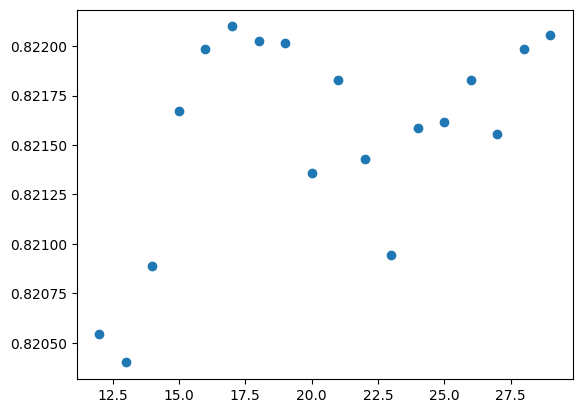

highest acc= 0.8221  for k= 17


<Figure size 5000x1000 with 0 Axes>

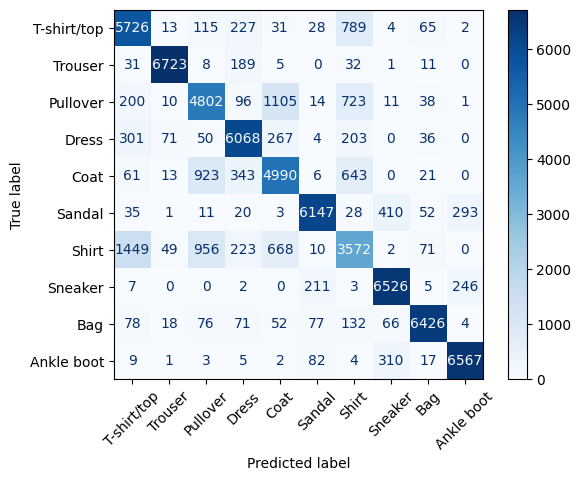

<Figure size 5000x1000 with 0 Axes>

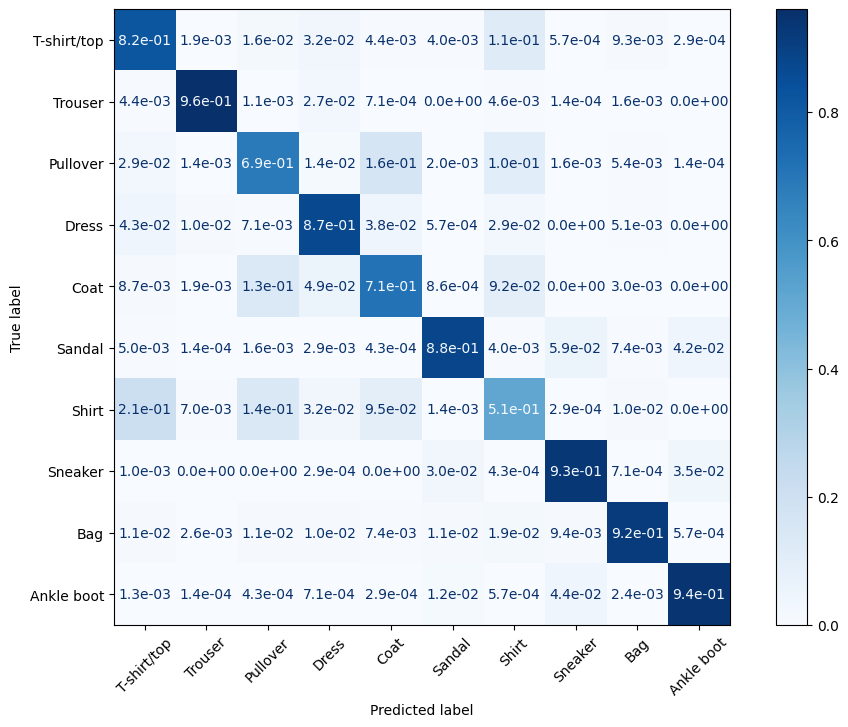

In [ ]:
plt.plot(k_values2, acc_t2, 'o')
plt.show()
acc_t2 = np.array(acc_t2)
print('highest acc=', np.max(acc_t2),' for k=', k_values2[np.argmax(acc_t2)])


plt.figure(figsize=(50, 10))
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm_t2[np.argmax(acc_t2)],
                                    display_labels = names)
cm_display.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.show()


plt.figure(figsize=(50, 10))
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm_t_norm2[np.argmax(acc_t2)],
                                    display_labels = names)
# cm_display.plot(cmap=plt.cm.Blues, xticks_rotation=45)

fig, ax = plt.subplots(figsize=(12, 8))  # Tworzymy figure i ax
cm_display.plot(cmap=plt.cm.Blues, xticks_rotation=45, ax=ax)

# Formatowanie tekstu na wykresie w notacji naukowej
for text in ax.texts:
    value = float(text.get_text())
    text.set_text(f'{value:.1e}')



plt.show()

In [42]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.neighbors import KNeighborsClassifier


X_train, X_test, y_train, y_test = train_test_split(Z_norm, id, test_size=0.2, random_state=42)


k_values = range(2, 10)
cm_t = []
cm_t_norm = []
acc_t = []
pred_t = []
acc_test = []

cm_test = []
cm_test_norm = []

for k in k_values:

    model = KNeighborsClassifier(n_neighbors=k)

    pred_train = cross_val_predict(model, X_train, y_train, cv=5)

    print(f'k = {k}')

    cm = confusion_matrix(y_train, pred_train)
    cm_t.append(cm)

    cm_norm = confusion_matrix(y_train, pred_train, normalize='true')
    cm_t_norm.append(cm_norm)

    acc_train = np.mean(pred_train == y_train)
    acc_t.append(acc_train)

    model.fit(X_train, y_train)
    pred_test = model.predict(X_test)

    cm_test.append(confusion_matrix(y_test, pred_test))
    cm_test_norm.append(confusion_matrix(y_test, pred_test, normalize='true'))

    acc_test_val = accuracy_score(y_test, pred_test)
    acc_test.append(acc_test_val)

    pred_t.append(pred_test)

print("\nAcc from cross_validation:")
for k, acc in zip(k_values, acc_t):
    print(f'k={k}, acc= {acc}')

print("\nAcc from test dataset:")
for k, acc in zip(k_values, acc_test):
    print(f'k={k}, acc= {acc}')



k = 2
k = 3
k = 4
k = 5
k = 6
k = 7
k = 8
k = 9

Acc from cross_validation:
k=2, acc= 0.8496428571428571
k=3, acc= 0.8603392857142858
k=4, acc= 0.8633035714285714
k=5, acc= 0.862625
k=6, acc= 0.8631785714285715
k=7, acc= 0.8622857142857143
k=8, acc= 0.8630535714285714
k=9, acc= 0.8601428571428571

Acc from test dataset:
k=2, acc= 0.8497857142857143
k=3, acc= 0.8595
k=4, acc= 0.8612857142857143
k=5, acc= 0.8607142857142858
k=6, acc= 0.8625
k=7, acc= 0.86
k=8, acc= 0.8616428571428572
k=9, acc= 0.8594285714285714


In [48]:
report = classification_report(y_test, pred_t[np.argmax(acc_test)], output_dict=True)

# Konwertowanie raportu na DataFrame dla łatwiejszej wizualizacji
report_df = pd.DataFrame(report).transpose()
print(k_values[np.argmax(acc_test)])
# Wyświetlenie raportu
report_df

6


,precision,recall,f1-score,support
0,0.761101,0.860071,0.807565,1415.0000
1,0.989505,0.967033,0.978140,1365.0000
2,0.744277,0.813438,0.777322,1399.0000
3,0.897616,0.875513,0.886427,1462.0000
4,0.790531,0.770629,0.780453,1430.0000
5,0.984127,0.893101,0.936407,1319.0000
6,0.670802,0.575177,0.619320,1410.0000
7,0.903543,0.955586,0.928836,1441.0000
8,0.972993,0.967344,0.970160,1378.0000
9,0.930183,0.955105,0.942479,1381.0000


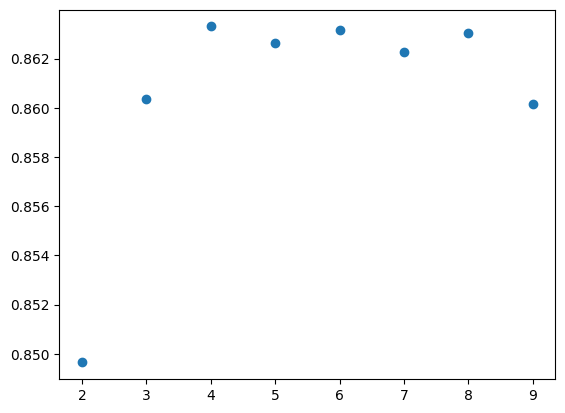

highest acc= 0.8633035714285714  for k= 4


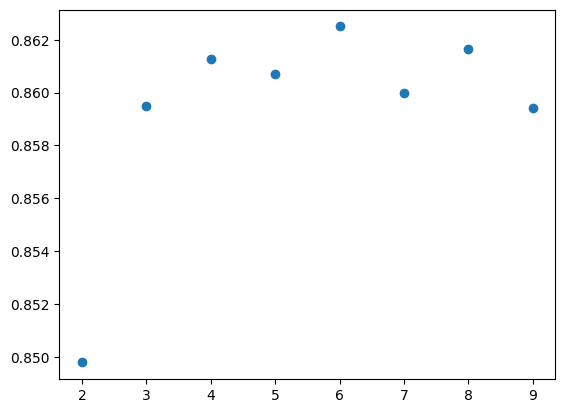

highest acc= 0.8625  for k= 6


<Figure size 5000x1000 with 0 Axes>

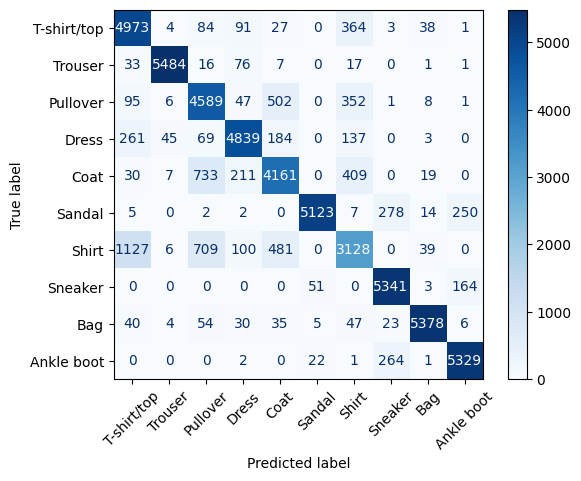

<Figure size 5000x1000 with 0 Axes>

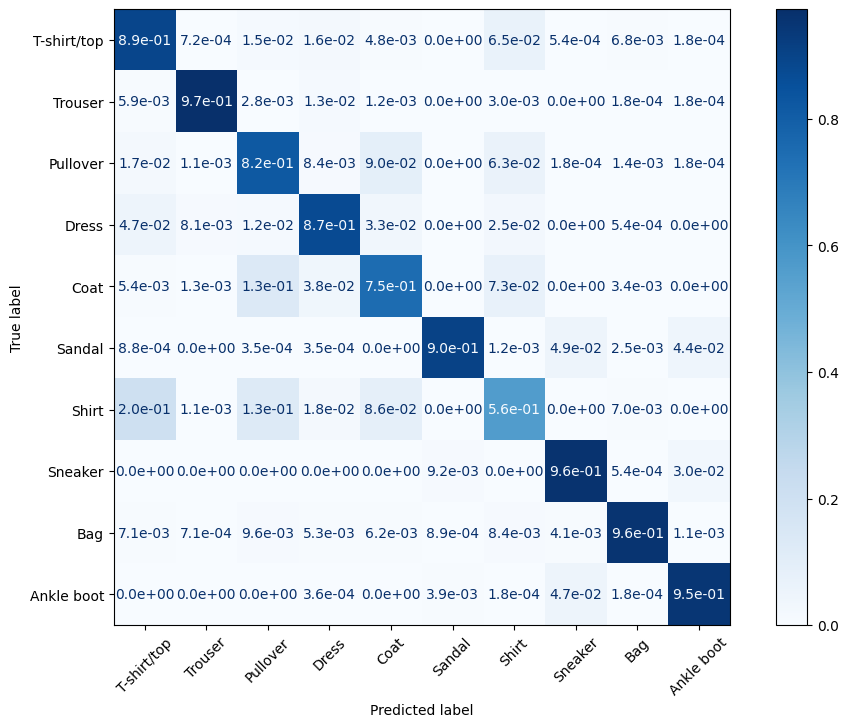

<Figure size 5000x1000 with 0 Axes>

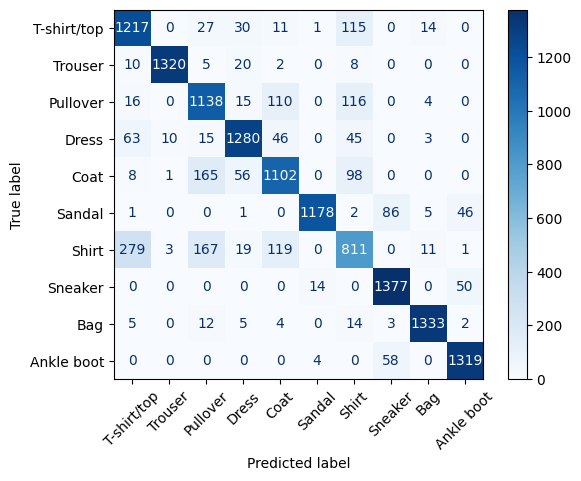

<Figure size 5000x1000 with 0 Axes>

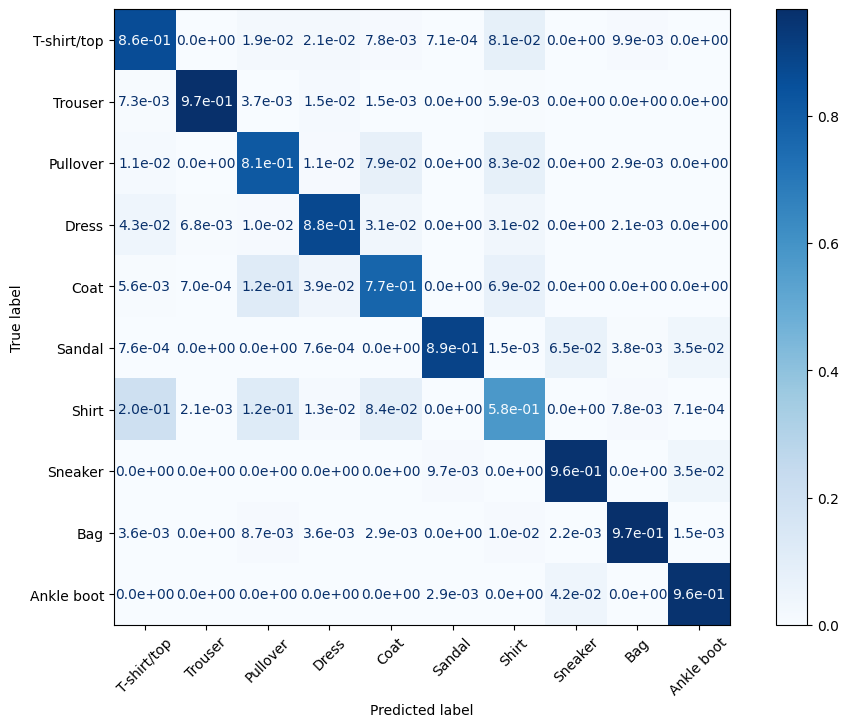

In [49]:
plt.plot(k_values, acc_t, 'o')
plt.show()
acc_t = np.array(acc_t)
print('highest acc=', np.max(acc_t),' for k=', k_values[np.argmax(acc_t)])


plt.plot(k_values, acc_test, 'o')
plt.show()
acc_test = np.array(acc_test)
print('highest acc=', np.max(acc_test),' for k=', k_values[np.argmax(acc_test)])


plt.figure(figsize=(50, 10))
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm_t[np.argmax(acc_t)],
                                    display_labels = names)
cm_display.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.show()


plt.figure(figsize=(50, 10))
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm_t_norm[np.argmax(acc_t)],
                                    display_labels = names)
# cm_display.plot(cmap=plt.cm.Blues, xticks_rotation=45)

fig, ax = plt.subplots(figsize=(12, 8))
cm_display.plot(cmap=plt.cm.Blues, xticks_rotation=45, ax=ax)


for text in ax.texts:
    value = float(text.get_text())

    text.set_text(f'{value:.1e}')
plt.show()



plt.figure(figsize=(50, 10))
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm_test[np.argmax(acc_test)],
                                    display_labels = names)
cm_display.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.show()


plt.figure(figsize=(50, 10))
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm_test_norm[np.argmax(acc_test)],
                                    display_labels = names)
# cm_display.plot(cmap=plt.cm.Blues, xticks_rotation=45)

fig, ax = plt.subplots(figsize=(12, 8))
cm_display.plot(cmap=plt.cm.Blues, xticks_rotation=45, ax=ax)


for text in ax.texts:
    value = float(text.get_text())

    text.set_text(f'{value:.1e}')



plt.show()

# GPT

Explained variance ratio for the first 50 components: [0.2205354  0.14401288 0.05460556 0.05107151 0.04057139 0.0301107
 0.02755667 0.02317104 0.01697951 0.01318989 0.01165625 0.00960786
 0.00901606 0.00858154 0.00745327 0.00727802 0.00660322 0.0063294
 0.00623096 0.00584543 0.00517589 0.00509999 0.00471921 0.00452904
 0.00437747 0.00418258 0.00398879 0.00391679 0.00383214 0.00374179
 0.00366205 0.00352848 0.00344225 0.00331251 0.00327014 0.0031722
 0.00310775 0.00299712 0.002866   0.00283548 0.00274527 0.00268418
 0.00262895 0.00255421 0.00246176 0.0024117  0.00238381 0.00228391
 0.00222278 0.0021405 ]


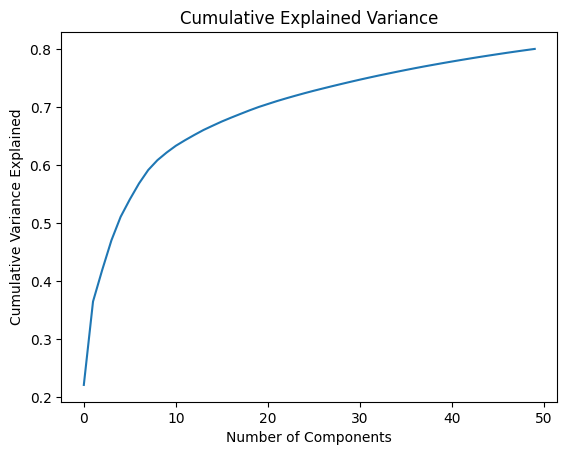

In [7]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'X' is your Fashion-MIST training data (flattened images)
# Normalize the data (zero mean and unit variance)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA
pca = PCA(n_components=50)  # Reduce to 50 dimensions, for example
X_pca = pca.fit_transform(X_scaled)

# Explained variance ratio
print("Explained variance ratio for the first 50 components:", pca.explained_variance_ratio_)

# Plot the cumulative explained variance
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title("Cumulative Explained Variance")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Variance Explained")
plt.show()


In [9]:
!pip install openTSNE

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 15.4 MB/s eta 0:00:00


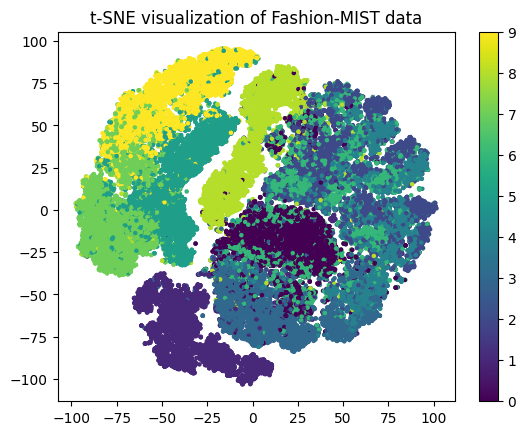

In [10]:
import openTSNE

# Stosujemy openTSNE
tsne = openTSNE.TSNE(random_state=42)
X_tsne = tsne.fit(X_pca)

# Plot the 2D representation of the data
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=id, cmap='viridis', s=5)
plt.colorbar()
plt.title("t-SNE visualization of Fashion-MIST data")
plt.show()


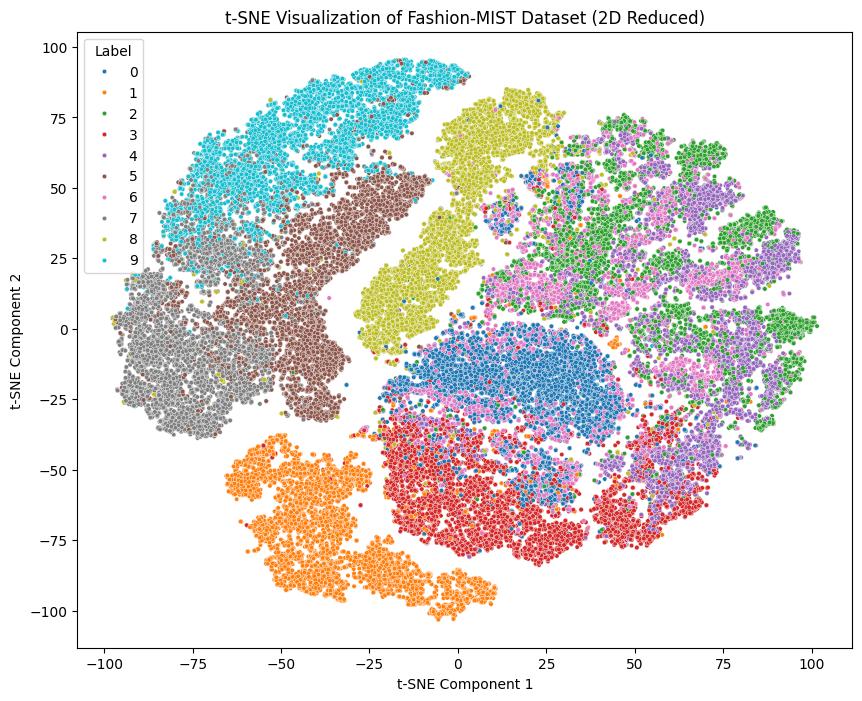

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming X_tsne contains the 2D reduced data from t-SNE and y_train contains the class labels
plt.figure(figsize=(10, 8))

# Plot the t-SNE results, color by labels
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=id, palette="tab10", s=10, legend='full')

# Adding labels and title
plt.title("t-SNE Visualization of Fashion-MIST Dataset (2D Reduced)")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend(title="Label", loc="best")
plt.show()


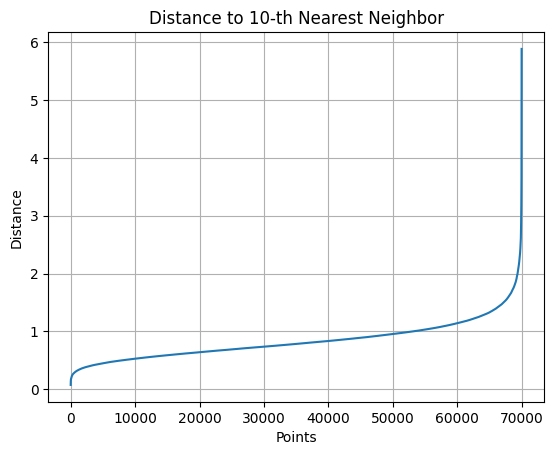

Punkt elbow: 69696 for distance=  2.2640356128363344
Odległość dla punktu elbow: 2.2640356128363344


In [28]:
n_neighbors = 10

distances, indices = NearestNeighbors(n_neighbors=n_neighbors).fit(X_tsne).kneighbors(X_tsne)
distances = np.sort(distances[:, -1], axis=0)

plt.plot(distances)
plt.title(f'Distance to {n_neighbors}-th Nearest Neighbor')
plt.xlabel('Points')
plt.ylabel('Distance')
plt.grid(True)
plt.show()

kneedle = KneeLocator(range(len(distances)), distances, curve='convex', direction='increasing')
elbow_point = kneedle.elbow

print(f'Punkt elbow: {elbow_point} for distance= ', distances[elbow_point])

lokiec = distances[elbow_point]
print(f'Odległość dla punktu elbow: {lokiec}')

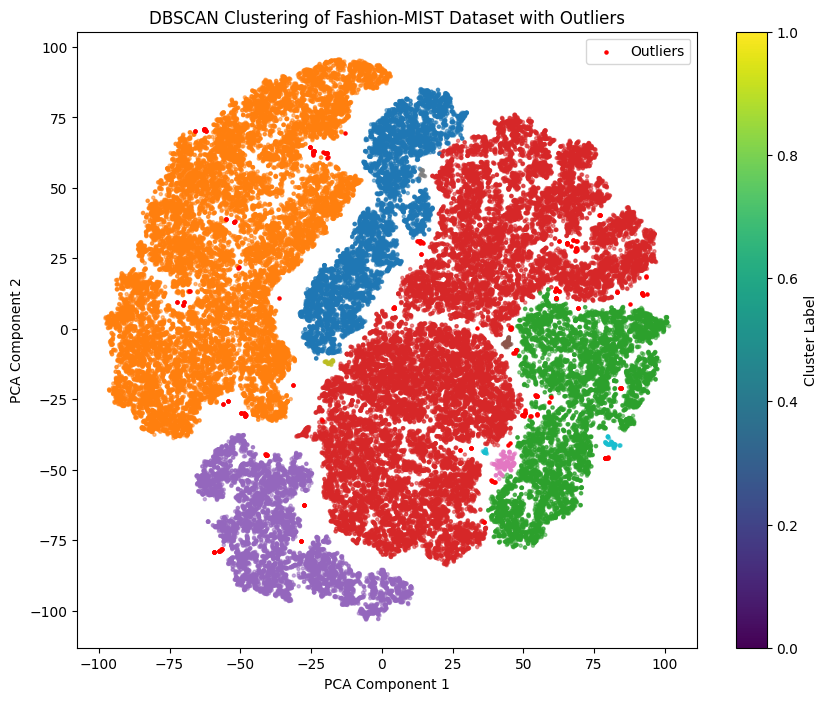

Number of outliers detected by DBSCAN: 251


In [32]:
from sklearn.cluster import DBSCAN

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=lokiec, min_samples=20)
y_pred_dbscan = dbscan.fit_predict(X_tsne)

# Evaluate DBSCAN clustering (skip outliers labeled as -1)
non_outliers = y_pred_dbscan != -1

# Plot DBSCAN results (outliers will be labeled as -1)
plt.figure(figsize=(10, 8))
plt.scatter(X_tsne[non_outliers, 0], X_tsne[non_outliers, 1], c=y_pred_dbscan[non_outliers], cmap='tab10', s=5, alpha=0.5)
plt.scatter(X_tsne[~non_outliers, 0], X_tsne[~non_outliers, 1], color='red', label='Outliers', s=5)
plt.title("DBSCAN Clustering of Fashion-MIST Dataset with Outliers")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.colorbar(label="Cluster Label")
plt.legend()
plt.show()

# Output number of outliers in DBSCAN
print(f"Number of outliers detected by DBSCAN: {np.sum(y_pred_dbscan == -1)}")


In [33]:
from sklearn.metrics import silhouette_score
import numpy as np

# Assume dbscan_labels is the result of DBSCAN clustering
# (e.g., dbscan_labels = dbscan.labels_)

# Calculate silhouette score
sil_score = silhouette_score(X_tsne, dbscan.labels_)
print(f"Silhouette Score: {sil_score:.4f}")


Silhouette Score: -0.2429


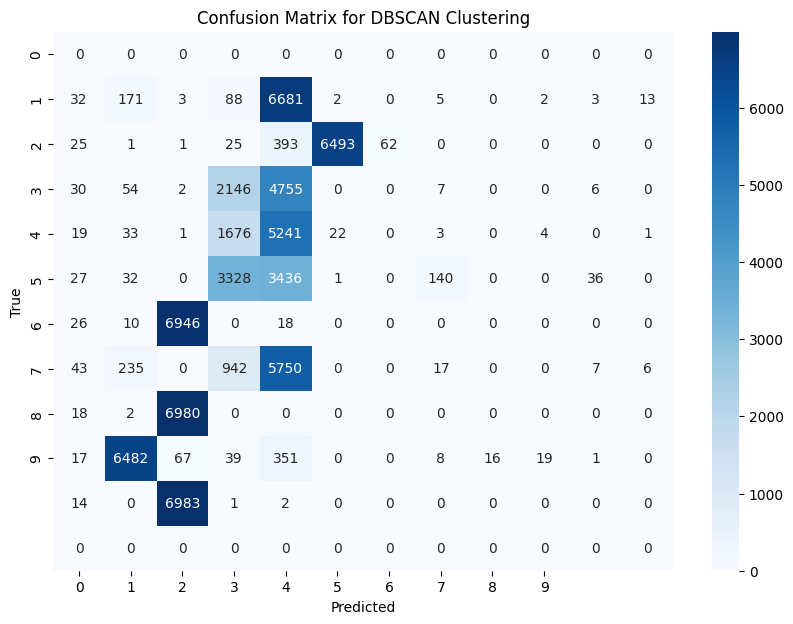

In [34]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Compute confusion matrix
conf_matrix = confusion_matrix(id, dbscan.labels_)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(id), yticklabels=np.unique(id))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for DBSCAN Clustering')
plt.show()


In [40]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.datasets import fashion_mnist

# Load the dataset
(X_train, y_train), (X_test, y_test) = fashion_mnist.load_data()

# Flatten the images to 1D arrays (28x28 to 784)
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)

# Split the training data into training and validation sets (80% train, 20% validation)
X_train_split, X_val, y_train_split, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42, stratify=y_train
)

# Scale the data (standardize to have zero mean and unit variance)
scaler = StandardScaler()
X_train_split = scaler.fit_transform(X_train_split)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

# Check the shapes after reshaping and scaling
print(f"Training data shape: {X_train_split.shape}")
print(f"Validation data shape: {X_val.shape}")
print(f"Test data shape: {X_test.shape}")


Training data shape: (48000, 784)
Validation data shape: (12000, 784)
Test data shape: (10000, 784)


In [41]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Initialize and train the Logistic Regression model
logreg = LogisticRegression(max_iter=1000, random_state=42)
logreg.fit(X_train_split, y_train_split)

# Predict on the validation and test sets
y_val_pred = logreg.predict(X_val)
y_test_pred = logreg.predict(X_test)

# Evaluate on the validation set
val_accuracy = accuracy_score(y_val, y_val_pred)
print(f"Validation Accuracy: {val_accuracy:.4f}")
print("Classification Report (Validation):")
print(classification_report(y_val, y_val_pred))

# Evaluate on the test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy: {test_accuracy:.4f}")
print("Classification Report (Test):")
print(classification_report(y_test, y_test_pred))

# Confusion matrix for the test set
conf_matrix = confusion_matrix(y_test, y_test_pred)
print("Confusion Matrix (Test):")
print(conf_matrix)


Validation Accuracy: 0.8505
Classification Report (Validation):
              precision    recall  f1-score   support

           0       0.80      0.82      0.81      1200
           1       0.96      0.96      0.96      1200
           2       0.76      0.75      0.75      1200
           3       0.85      0.85      0.85      1200
           4       0.75      0.77      0.76      1200
           5       0.94      0.94      0.94      1200
           6       0.65      0.61      0.63      1200
           7       0.93      0.93      0.93      1200
           8       0.93      0.93      0.93      1200
           9       0.94      0.94      0.94      1200

    accuracy                           0.85     12000
   macro avg       0.85      0.85      0.85     12000
weighted avg       0.85      0.85      0.85     12000

Test Accuracy: 0.8318
Classification Report (Test):
              precision    recall  f1-score   support

           0       0.79      0.80      0.80      1000
           1    